In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import h5py
import scipy.sparse as sp
import yaml
import time
from tqdm import tqdm
import gget
import scipy
from scipy.stats import zscore
from tqdm import tqdm
from statsmodels.stats.multitest import multipletests
from scipy.spatial.distance import cdist
from scipy.stats import spearmanr

import anndata as an
import scanpy as sc
import scanpy.external as sce
import rapids_singlecell as rsc
import scvi


import cupy as cp
from cuml.manifold import TSNE
from cuml.decomposition import PCA

sc.settings.verbosity = 3

09:43:17 - INFO - Old pandas version detected. Patching DataFrame.map to DataFrame.applymap
/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_categorical_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)
/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_continuous_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)


In [2]:
%%time
fpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/cc_fibroblast_full/anndata/cell_cycle_annotated.h5ad"
adata = sc.read_h5ad(fpath)
adata

CPU times: user 146 ms, sys: 893 ms, total: 1.04 s
Wall time: 3.42 s


AnnData object with n_obs × n_vars = 7541 × 21412
    obs: 'phase', 'barcoded_phase', 'S_score', 'G2M_score'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'g2m_genes', 's_genes'
    layers: 'log_norm', 'raw_counts'

[2025-05-09 09:43:36.283] [CUML] [debug] n_neighbors=500
[2025-05-09 09:43:36.284] [CUML] [debug] Calling knn graph run
[2025-05-09 09:43:36.284] [CUML] [debug] Done. Calling fuzzy simplicial set
[2025-05-09 09:43:36.349] [CUML] [debug] Done. Calling remove zeros
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:04)
--> added 'pos', the PAGA positions (adata.uns['paga'])


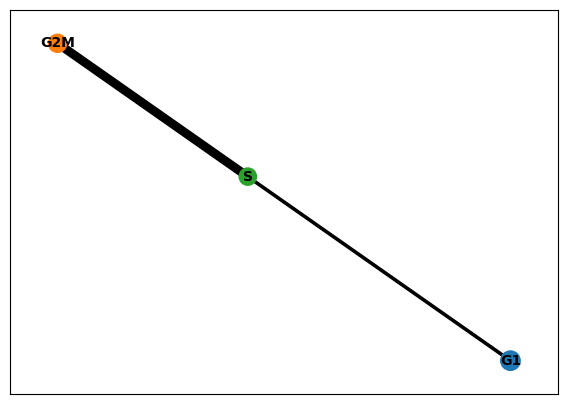

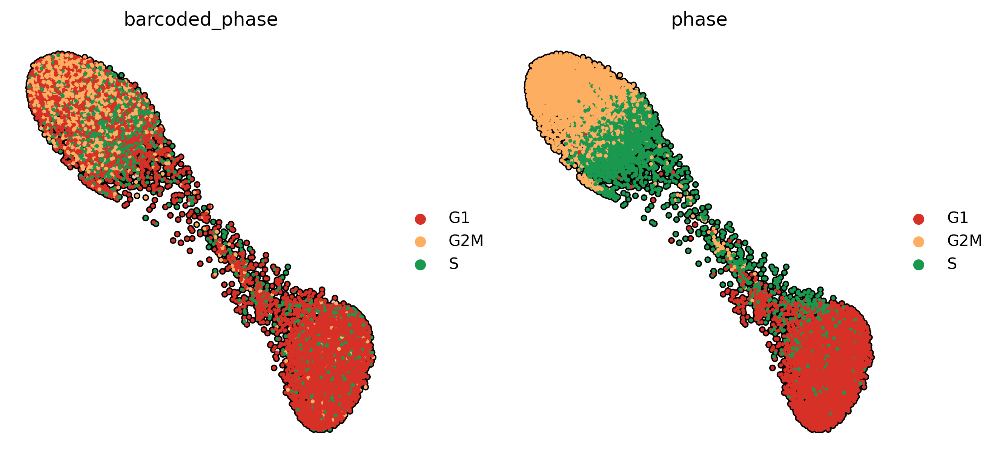

In [3]:
rsc.pp.pca(adata)
rsc.pp.neighbors(adata, n_neighbors=500)
sc.tl.paga(adata, groups='phase')
sc.pl.paga(adata)
rsc.tl.draw_graph(adata, init_pos='paga')

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4.25, 4.75

palette = {
    "G1": "#D73027",        # strong red (Cdt1+)
    "S": "#1A9850",         # green (Geminin+)
    "G2M": "#FDAE61",       # orange-yellow (Cdt1+/Geminin+)
    "unknown": "#B0B0B0", # Neutral gray
}

sc.pl.draw_graph(
    adata, 
    color=['barcoded_phase', 'phase'],
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    na_in_legend=False,
    outline_color=('k', 'k'),
    frameon=False,
    palette=palette
)

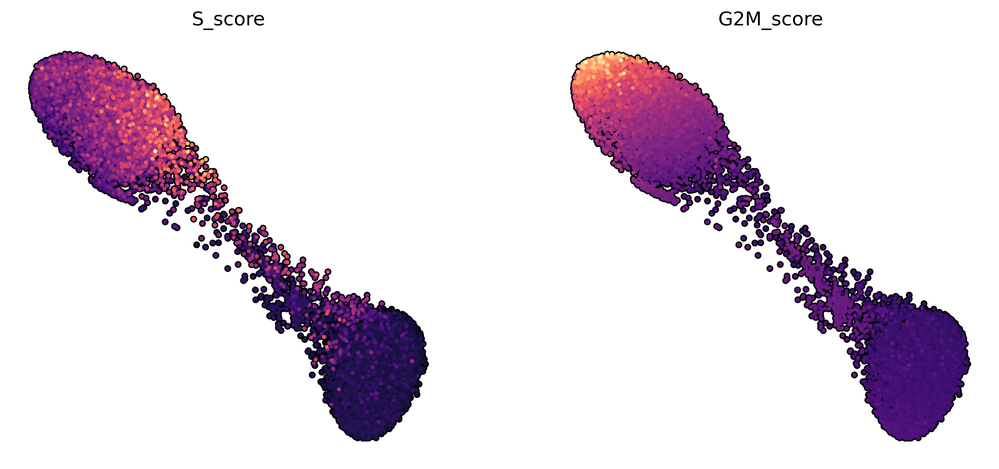

In [4]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4.25, 4.75

sc.pl.draw_graph(
    adata, 
    color=['S_score', 'G2M_score',],
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    na_in_legend=False,
    colorbar_loc=None,
    cmap='magma',
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.25,
)

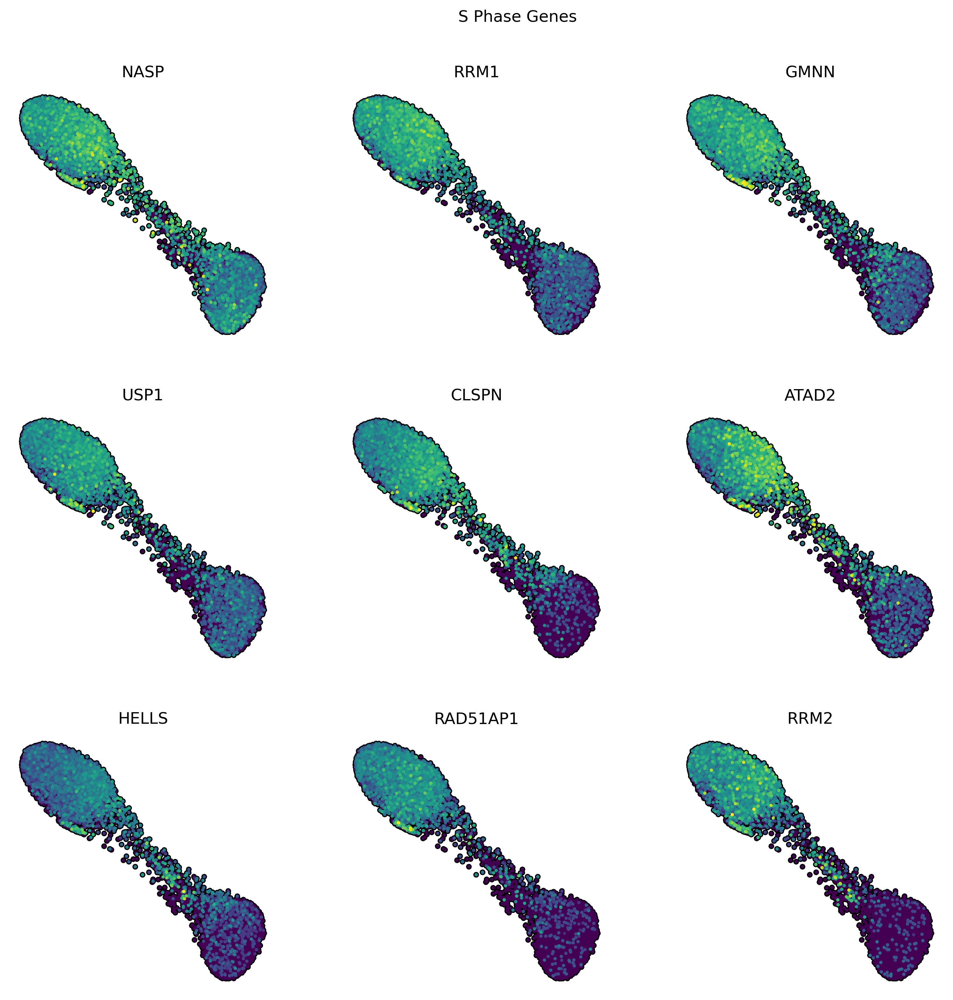

In [5]:
# get higest expressed S phase genes
s_genes = adata.uns['s_genes']
mean_expr = adata[:, s_genes].X.mean(axis=0).A1  
top9_genes = [s_genes[i] for i in mean_expr.argsort()[::-1][:9]]

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 3.25, 3.75

fig = sc.pl.draw_graph(
    adata, 
    color=top9_genes,
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    na_in_legend=False,
    colorbar_loc=None,
    outline_color=('k', 'k'),
    frameon=False,
    show=False, 
    return_fig=True,  
)

fig.suptitle("S Phase Genes", y=0.95)
plt.show()

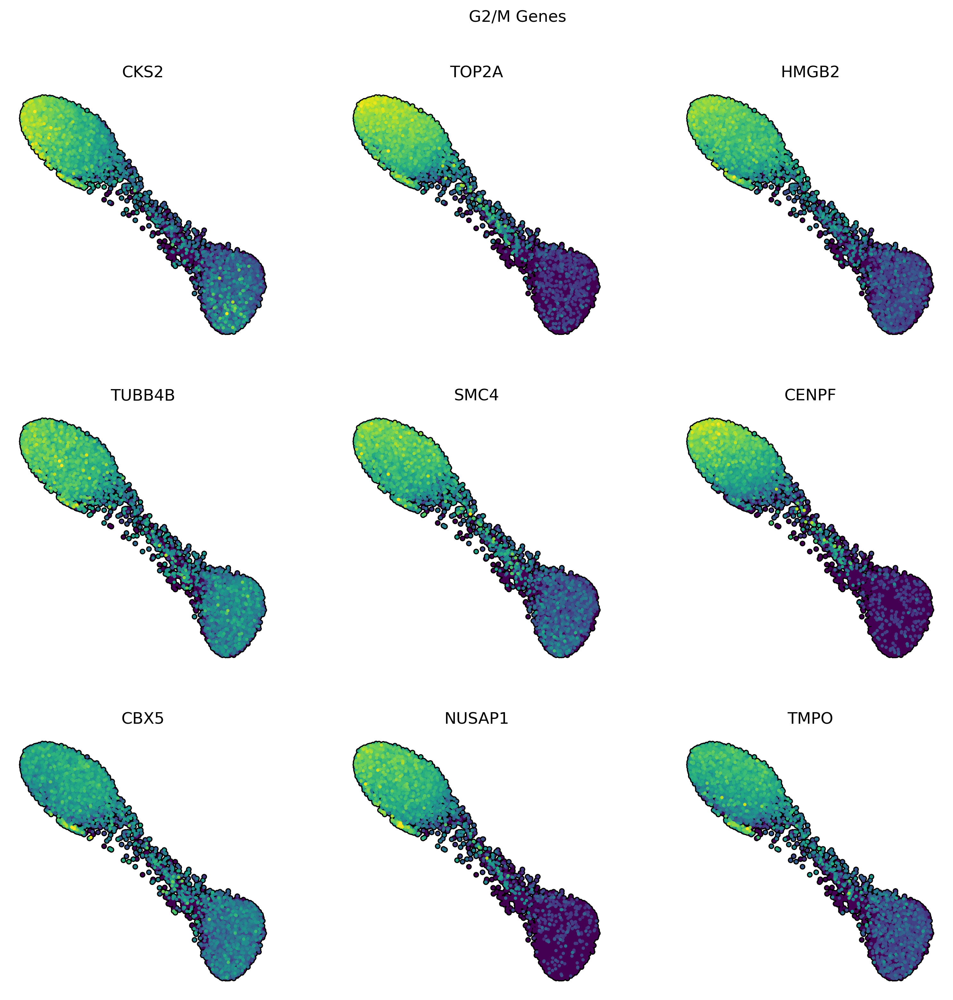

In [6]:
# get higest expressed S phase genes
g2m_genes = adata.uns['g2m_genes']
mean_expr = adata[:, g2m_genes].X.mean(axis=0).A1  
top9_genes = [g2m_genes[i] for i in mean_expr.argsort()[::-1][:9]]

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 3.25, 3.75

fig = sc.pl.draw_graph(
    adata, 
    color=top9_genes,
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    na_in_legend=False,
    colorbar_loc=None,
    outline_color=('k', 'k'),
    frameon=False,
    show=False, 
    return_fig=True,  
)

fig.suptitle("G2/M Genes", y=0.95)
plt.show()

# pseudo time

In [7]:
adata

AnnData object with n_obs × n_vars = 7541 × 21412
    obs: 'phase', 'barcoded_phase', 'S_score', 'G2M_score'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'g2m_genes', 's_genes', 'pca', 'neighbors', 'paga', 'phase_sizes', 'phase_colors', 'draw_graph', 'barcoded_phase_colors'
    obsm: 'X_pca', 'X_draw_graph_fa'
    varm: 'PCs'
    layers: 'log_norm', 'raw_counts'
    obsp: 'distances', 'connectivities'

In [8]:
# Select the G1-phase cells, compute their median PCA vector,
# calculate the Euclidean distance from each G1 cell to this median,
# and return the cell closest to the median in PCA space.

# Get PCA coordinates for G1-phase cells
g1_mask = adata.obs['phase'] == 'G1'
g1_pca = adata.obsm['X_pca'][g1_mask]

# Compute median PCA vector
median_vec = np.median(g1_pca, axis=0)

# Compute Euclidean distance from each G1 cell to the median
dists = cdist(g1_pca, median_vec.reshape(1, -1)).flatten()

# Get the index of the closest G1 cell
closest_idx = np.argmin(dists)

# Retrieve the original adata index of the closest G1 cell
closest_cell_id = adata.obs_names[g1_mask][closest_idx]

closest_cell_id

'ACTCAATAGTGCTGTA-1'

[2025-05-09 09:43:50.450] [CUML] [debug] n_neighbors=3
[2025-05-09 09:43:50.450] [CUML] [debug] Calling knn graph run
[2025-05-09 09:43:50.450] [CUML] [debug] Done. Calling fuzzy simplicial set
[2025-05-09 09:43:50.451] [CUML] [debug] Done. Calling remove zeros
computing Diffusion Pseudotime using n_dcs=4
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


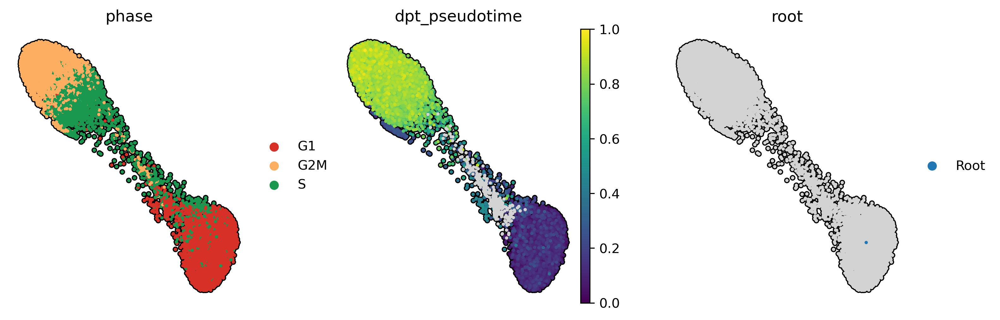

In [9]:
rsc.pp.neighbors(adata, n_neighbors=3)
rsc.tl.diffmap(adata)

# set root and compute pseudotime
adata.uns["iroot"] = list(adata.obs_names).index(closest_cell_id)
sc.tl.dpt(adata, n_dcs=4)

# for plotting
adata.obs['root'] = np.where(adata.obs.index == closest_cell_id, 'Root', pd.NA)

sc.pl.draw_graph(
    adata, 
    color=['phase', 'dpt_pseudotime', 'root'],
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    na_in_legend=False,
    outline_color=('k', 'k'),
    frameon=False,
)

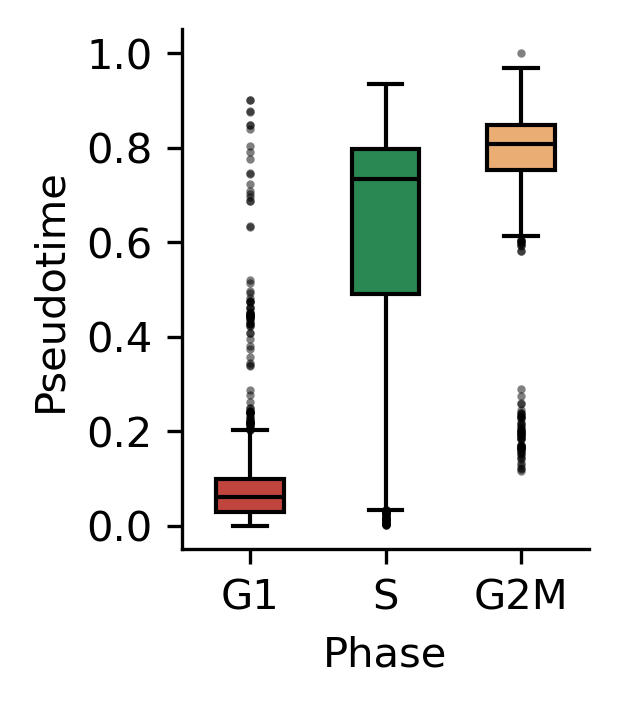

In [10]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 1.75, 2.25

sns.boxplot(
    data=adata.obs,
    x='phase',
    y='dpt_pseudotime',
    hue='phase',
    order=['G1', 'S', 'G2M'],
    palette=palette,
    width=0.5,
    flierprops={'markersize':1, 'color':'grey', 'alpha':0.5},
    linecolor='k',
)

plt.xlabel('Phase')
plt.ylabel('Pseudotime')
sns.despine()

In [11]:
print(adata.obs.head().to_string())

                   phase barcoded_phase   S_score  G2M_score  dpt_pseudotime root
AAACCAAAGGGTAGCA-1   G2M            G2M  1.107143   2.095745        0.820494  NaN
AAACCAAAGTAAGGGT-1    G1             G1 -0.115079  -1.486498        0.024702  NaN
AAACCATTCAGGTAGG-1   G2M             G1  0.976190   2.537643        0.662856  NaN
AAACCATTCCAGCCCT-1    G1              S -0.087302  -1.821399        0.025359  NaN
AAACCATTCGTGACCG-1    G1             G1 -0.220238  -1.475450        0.080631  NaN


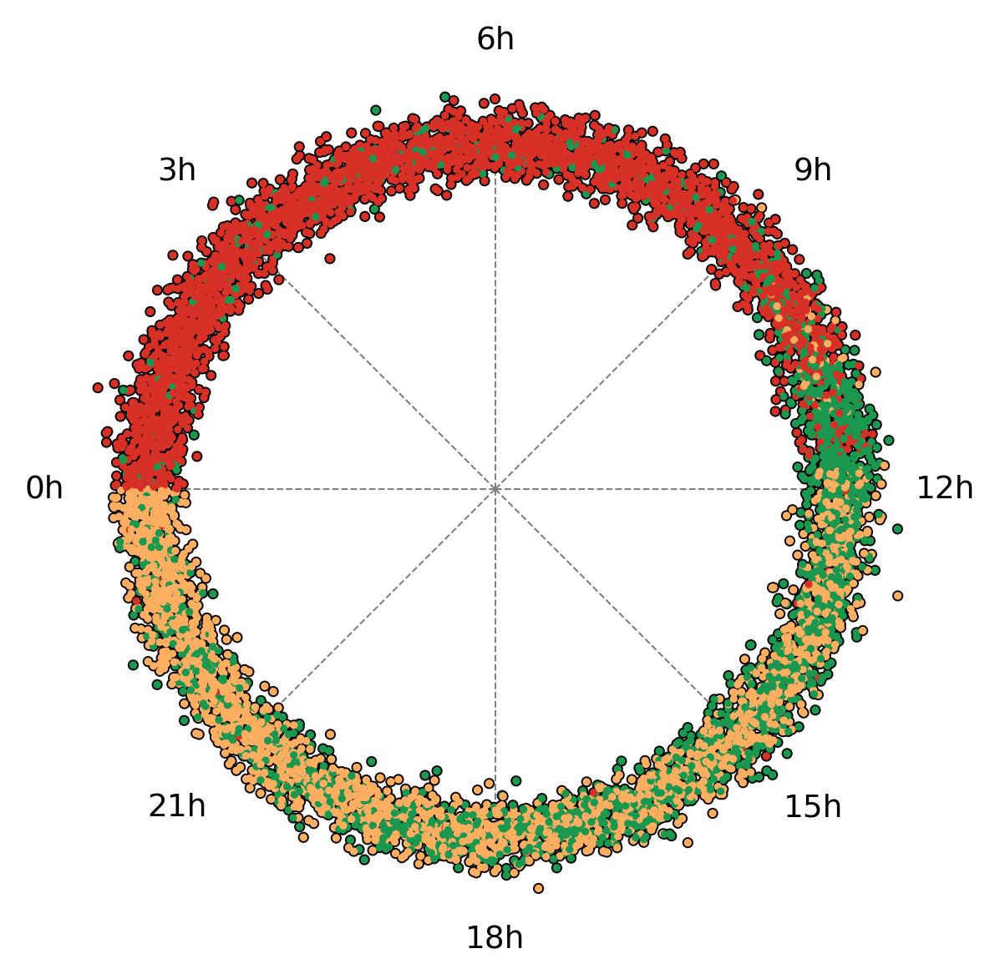

In [12]:
df = adata.obs.copy()

# Clean data
df = df[np.isfinite(df['dpt_pseudotime'])].copy()


# Use ranked pseudotime for even angular spacing
theta = df['dpt_pseudotime'].rank() / len(df) * 2 * np.pi
r = 1 + np.random.normal(0, 0.05, size=len(theta))

# Convert polar to Cartesian
df['x'] = r * np.cos(theta)
df['y'] = r * np.sin(theta)

plt.figure(figsize=(4, 4))

sns.scatterplot(
    data=df,
    x='x', 
    y='y',
    c='k',
    s=10,
    edgecolor='none', 
    legend=False,
    zorder=1,
)

sns.scatterplot(
    data=df,
    x='x', 
    y='y',
    hue='phase', 
    s=5,
    edgecolor='none', 
    legend=False,
    palette=palette,
    zorder=5,
)

# Hour ticks and radial lines
for hour in range(0, 24, 3):
    angle = hour / 24 * 2 * np.pi
    x_line = np.cos(angle)
    y_line = np.sin(angle)
    plt.plot([0, x_line], [0, y_line], color='gray', linewidth=0.5, linestyle='--', zorder=0)
    x_text = 1.3 * np.cos(angle)
    y_text = 1.3 * np.sin(angle)
    plt.text(x_text, y_text, f'{hour}h', ha='center', va='center', fontsize=9)

plt.axis('equal')
plt.xticks([])
plt.yticks([])
plt.gca().invert_xaxis()
plt.xlabel("")
plt.ylabel("")
plt.axis(False)
plt.tight_layout()
plt.show()


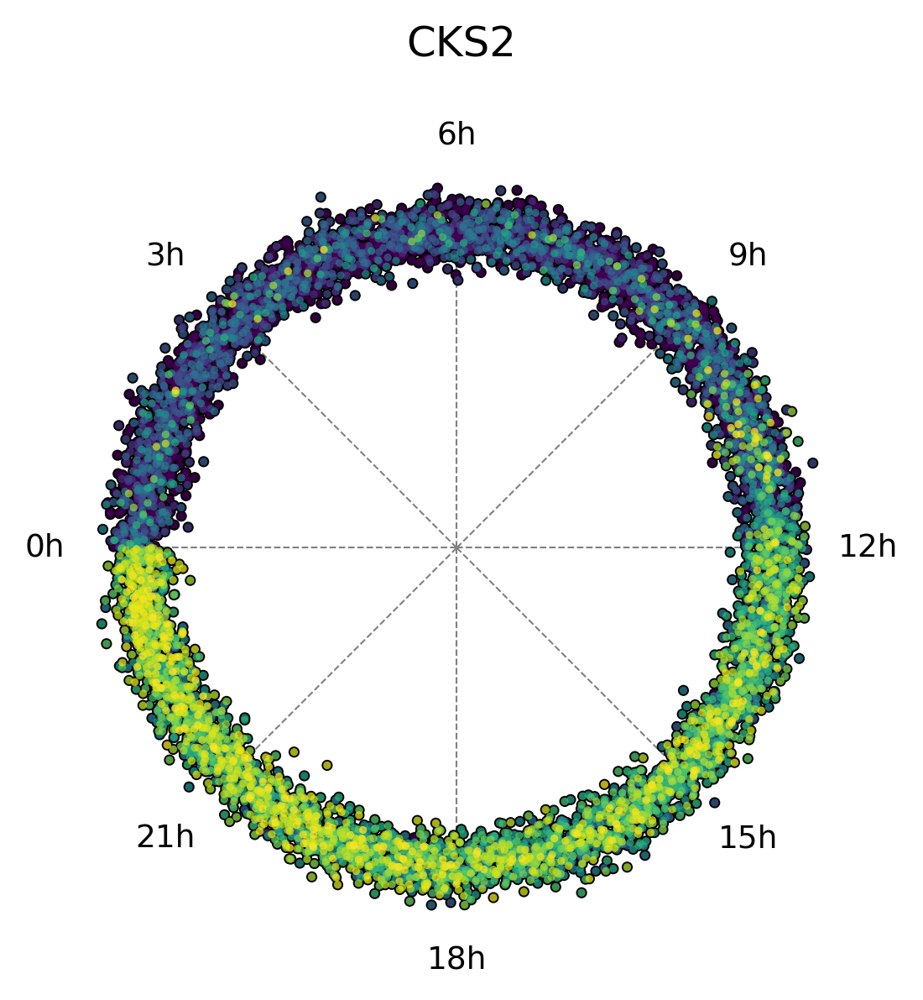

In [13]:
query = 'CKS2'
df = adata.obs.copy()
df['gene'] = adata[:, query].X.todense()

# Clean data
df = df[np.isfinite(df['dpt_pseudotime'])].copy()

df['gene'] = df['gene'].rank() 
df = df.sort_values(by='gene')

# Use ranked pseudotime for even angular spacing
theta = df['dpt_pseudotime'].rank() / len(df) * 2 * np.pi
r = 1 + np.random.normal(0, 0.05, size=len(theta))

# Convert polar to Cartesian
df['x'] = r * np.cos(theta)
df['y'] = r * np.sin(theta)

plt.figure(figsize=(4, 4))

sns.scatterplot(
    data=df,
    x='x', 
    y='y',
    c='k',
    s=10,
    edgecolor='none', 
    legend=False,
    zorder=1,
)

sns.scatterplot(
    data=df,
    x='x', 
    y='y',
    hue='gene', 
    s=5,
    edgecolor='none', 
    alpha=0.75,
    legend=False,
    palette='viridis',
)

# Hour ticks and radial lines
for hour in range(0, 24, 3):
    angle = hour / 24 * 2 * np.pi
    x_line = np.cos(angle)
    y_line = np.sin(angle)
    plt.plot([0, x_line], [0, y_line], color='gray', linewidth=0.5, linestyle='--', zorder=0)
    x_text = 1.3 * np.cos(angle)
    y_text = 1.3 * np.sin(angle)
    plt.text(x_text, y_text, f'{hour}h', ha='center', va='center', fontsize=9)

plt.axis('equal')
plt.xticks([])
plt.suptitle(query)
plt.yticks([])
plt.gca().invert_xaxis()
plt.xlabel("")
plt.ylabel("")
plt.axis(False)
plt.tight_layout()
plt.show()

In [14]:
%%time
df = adata.obs.copy()

# add genes
df = pd.concat([df, adata.to_df()], axis=1)

# filter data
df = df[np.isfinite(df['dpt_pseudotime'])].copy()
df['dpt_rank'] = df['dpt_pseudotime'].rank()

results = []
for gene in tqdm(adata.var_names, desc="Computing Spearman errors"):
    df[gene] = df[gene].rank()
    error = 1 - spearmanr(df['dpt_rank'], df[gene]).correlation
    results.append({
        'gene' : gene,
        'error' : error,
    })

results = pd.DataFrame(results)
results = results.sort_values('error')
results.head(15)

Computing Spearman errors: 100%|██████████| 21412/21412 [00:40<00:00, 534.30it/s]


CPU times: user 41.3 s, sys: 3.38 s, total: 44.6 s
Wall time: 44.8 s


,gene,error
2409,CENPF,0.186221
19469,TOP2A,0.196692
1017,ASPM,0.203898
14310,NUSAP1,0.204012
15610,PRC1,0.204341
13125,MKI67,0.213616
15969,PTTG1,0.215400
19947,UBE2C,0.220236
19532,TPX2,0.220451
10349,HMGB2,0.229917


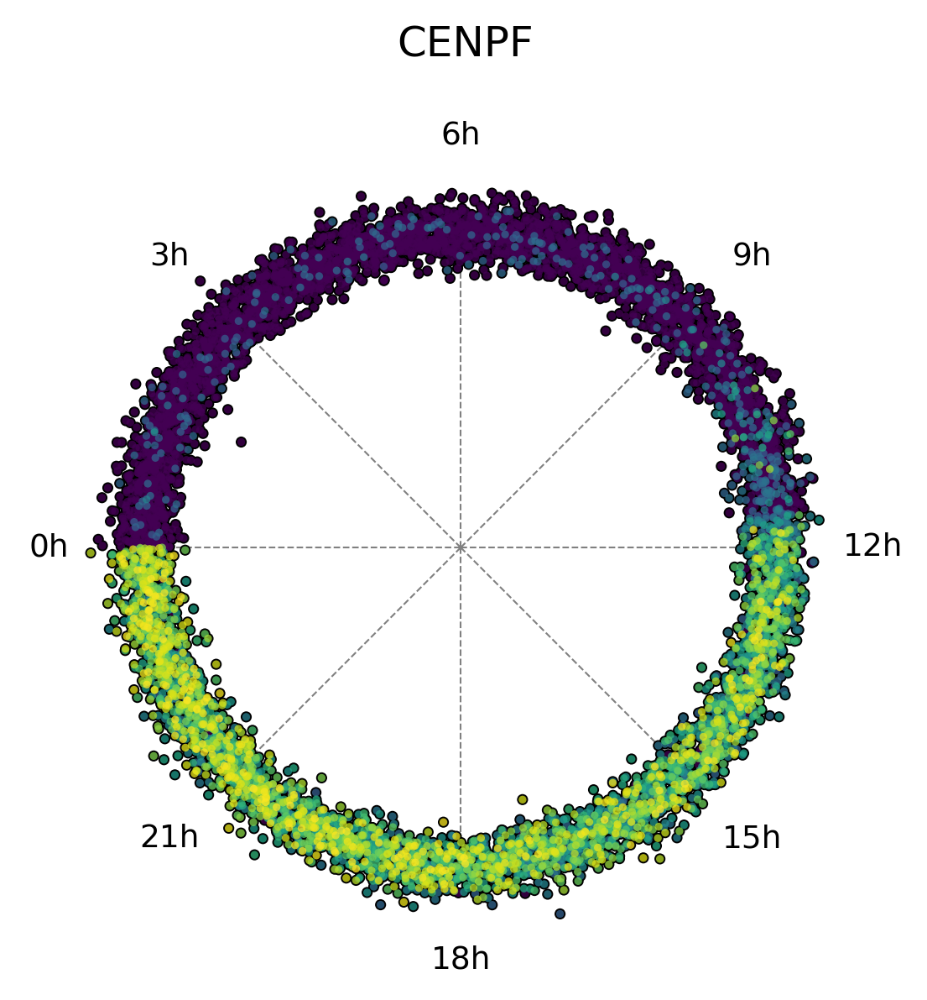

In [15]:
query = 'CENPF'
df = adata.obs.copy()
df['gene'] = adata[:, query].X.todense()

# Clean data
df = df[np.isfinite(df['dpt_pseudotime'])].copy()

df['gene'] = df['gene'].rank() 
df = df.sort_values(by='gene')

# Use ranked pseudotime for even angular spacing
theta = df['dpt_pseudotime'].rank() / len(df) * 2 * np.pi
r = 1 + np.random.normal(0, 0.05, size=len(theta))

# Convert polar to Cartesian
df['x'] = r * np.cos(theta)
df['y'] = r * np.sin(theta)

plt.figure(figsize=(4, 4))

sns.scatterplot(
    data=df,
    x='x', 
    y='y',
    c='k',
    s=10,
    edgecolor='none', 
    legend=False,
    zorder=1,
)

sns.scatterplot(
    data=df,
    x='x', 
    y='y',
    hue='gene', 
    s=5,
    edgecolor='none', 
    alpha=0.75,
    legend=False,
    palette='viridis',
)

# Hour ticks and radial lines
for hour in range(0, 24, 3):
    angle = hour / 24 * 2 * np.pi
    x_line = np.cos(angle)
    y_line = np.sin(angle)
    plt.plot([0, x_line], [0, y_line], color='gray', linewidth=0.5, linestyle='--', zorder=0)
    x_text = 1.3 * np.cos(angle)
    y_text = 1.3 * np.sin(angle)
    plt.text(x_text, y_text, f'{hour}h', ha='center', va='center', fontsize=9)

plt.axis('equal')
plt.xticks([])
plt.suptitle(query)
plt.yticks([])
plt.gca().invert_xaxis()
plt.xlabel("")
plt.ylabel("")
plt.axis(False)
plt.tight_layout()
plt.show()

In [16]:
break

SyntaxError: 'break' outside loop (668683560.py, line 1)